<a href="https://colab.research.google.com/github/aapatil2004/Credit_Card_Fraud_Detection/blob/amaan/ccfd_using_geospatial_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd

# Load your dataset
data = pd.read_csv('/content/creditcard.csv')


In [ ]:
print(data.head())

   Time        V1        V2        V3        V4        V5        V6        V7  \
0   0.0 -1.359807 -0.072781  2.536347  1.378155 -0.338321  0.462388  0.239599   
1   0.0  1.191857  0.266151  0.166480  0.448154  0.060018 -0.082361 -0.078803   
2   1.0 -1.358354 -1.340163  1.773209  0.379780 -0.503198  1.800499  0.791461   
3   1.0 -0.966272 -0.185226  1.792993 -0.863291 -0.010309  1.247203  0.237609   
4   2.0 -1.158233  0.877737  1.548718  0.403034 -0.407193  0.095921  0.592941   

         V8        V9  ...       V23       V24       V25       V26       V27  \
0  0.098698  0.363787  ... -0.110474  0.066928  0.128539 -0.189115  0.133558   
1  0.085102 -0.255425  ...  0.101288 -0.339846  0.167170  0.125895 -0.008983   
2  0.247676 -1.514654  ...  0.909412 -0.689281 -0.327642 -0.139097 -0.055353   
3  0.377436 -1.387024  ... -0.190321 -1.175575  0.647376 -0.221929  0.062723   
4 -0.270533  0.817739  ... -0.137458  0.141267 -0.206010  0.502292  0.219422   

        V28  Amount  Class   Lat

In [ ]:
# Get a general overview of the data
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 33 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Time       284807 non-null  float64
 1   V1         284807 non-null  float64
 2   V2         284807 non-null  float64
 3   V3         284807 non-null  float64
 4   V4         284807 non-null  float64
 5   V5         284807 non-null  float64
 6   V6         284807 non-null  float64
 7   V7         284807 non-null  float64
 8   V8         284807 non-null  float64
 9   V9         284807 non-null  float64
 10  V10        284807 non-null  float64
 11  V11        284807 non-null  float64
 12  V12        284807 non-null  float64
 13  V13        284807 non-null  float64
 14  V14        284807 non-null  float64
 15  V15        284807 non-null  float64
 16  V16        284807 non-null  float64
 17  V17        284807 non-null  float64
 18  V18        284807 non-null  float64
 19  V19        284807 non-n

In [ ]:
print(data.describe())

                Time            V1            V2            V3            V4  \
count  284807.000000  2.848070e+05  2.848070e+05  2.848070e+05  2.848070e+05   
mean    94813.859575  1.759061e-12 -8.251130e-13 -9.654937e-13  8.321385e-13   
std     47488.145955  1.958696e+00  1.651309e+00  1.516255e+00  1.415869e+00   
min         0.000000 -5.640751e+01 -7.271573e+01 -4.832559e+01 -5.683171e+00   
25%     54201.500000 -9.203734e-01 -5.985499e-01 -8.903648e-01 -8.486401e-01   
50%     84692.000000  1.810880e-02  6.548556e-02  1.798463e-01 -1.984653e-02   
75%    139320.500000  1.315642e+00  8.037239e-01  1.027196e+00  7.433413e-01   
max    172792.000000  2.454930e+00  2.205773e+01  9.382558e+00  1.687534e+01   

                 V5            V6            V7            V8            V9  \
count  2.848070e+05  2.848070e+05  2.848070e+05  2.848070e+05  2.848070e+05   
mean   1.649999e-13  4.248366e-13 -3.054600e-13  8.777971e-14 -1.179749e-12   
std    1.380247e+00  1.332271e+00  1.23709

In [ ]:
# Check for missing values
print(data.isnull().sum())

Time         0
V1           0
V2           0
V3           0
V4           0
V5           0
V6           0
V7           0
V8           0
V9           0
V10          0
V11          0
V12          0
V13          0
V14          0
V15          0
V16          0
V17          0
V18          0
V19          0
V20          0
V21          0
V22          0
V23          0
V24          0
V25          0
V26          0
V27          0
V28          0
Amount       0
Class        0
Latitude     0
Longitude    0
dtype: int64


In [ ]:
print(data.dtypes)

Time         float64
V1           float64
V2           float64
V3           float64
V4           float64
V5           float64
V6           float64
V7           float64
V8           float64
V9           float64
V10          float64
V11          float64
V12          float64
V13          float64
V14          float64
V15          float64
V16          float64
V17          float64
V18          float64
V19          float64
V20          float64
V21          float64
V22          float64
V23          float64
V24          float64
V25          float64
V26          float64
V27          float64
V28          float64
Amount       float64
Class          int64
Latitude     float64
Longitude    float64
dtype: object


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

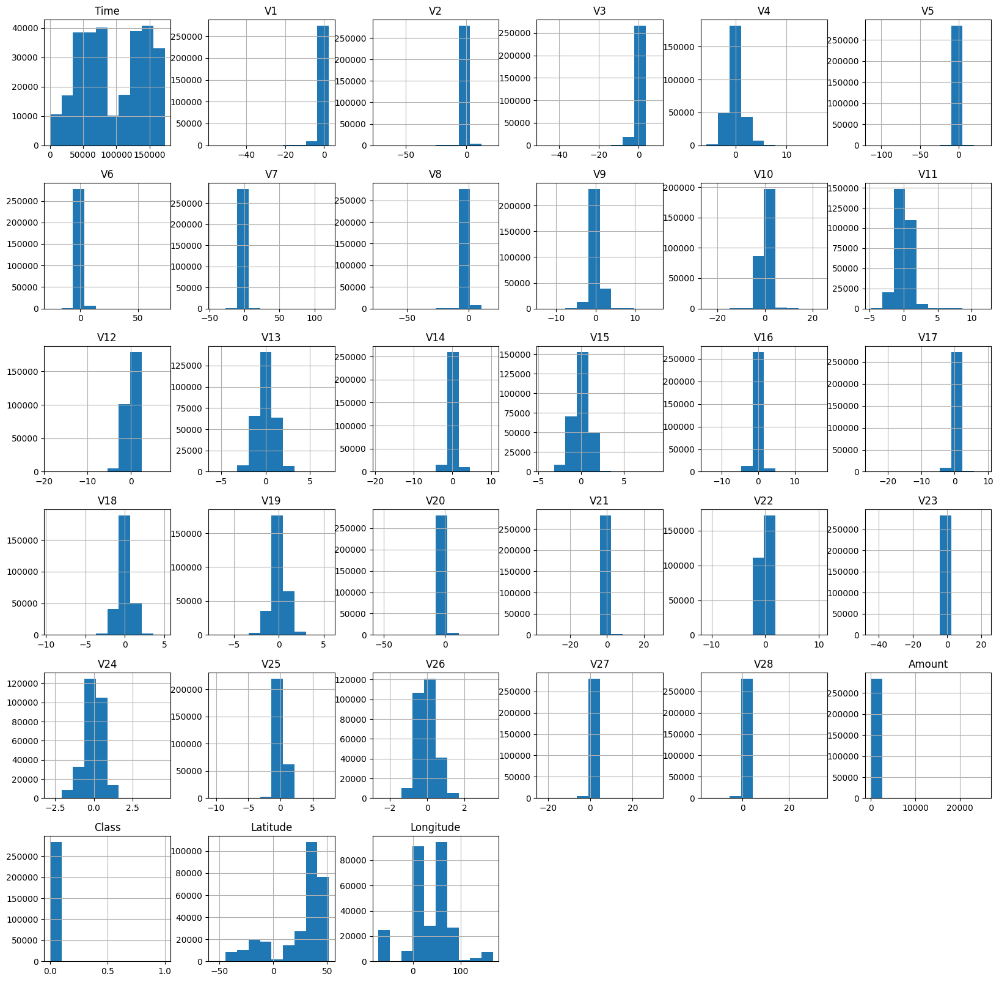

In [ ]:
# Plot histograms for numerical features
data.hist(figsize=(20, 20))
plt.show()

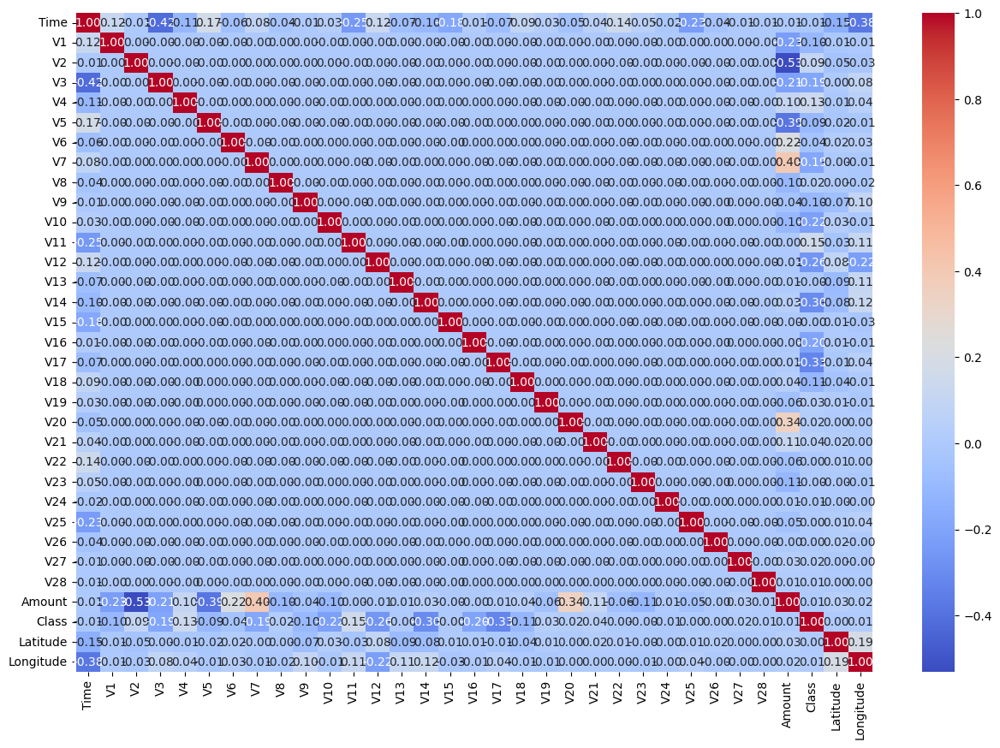

In [ ]:
# Plot the correlation matrix
corr = data.corr()
plt.figure(figsize=(15, 10))
sns.heatmap(corr, annot=True, fmt='.2f', cmap='coolwarm')
plt.show()

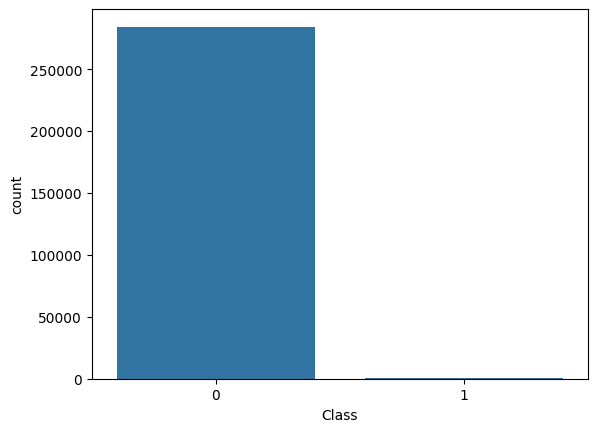

In [ ]:
# Visualize the distribution of the target variable
sns.countplot(x='Class', data=data)
plt.show()

In [ ]:
data.shape

(284807, 33)

In [ ]:
data['Amount'].describe()

count    284807.000000
mean         88.349619
std         250.120109
min           0.000000
25%           5.600000
50%          22.000000
75%          77.165000
max       25691.160000
Name: Amount, dtype: float64

In [ ]:
!pip install geopy geojson

In [ ]:
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V23,V24,V25,V26,V27,V28,Amount,Class,Latitude,Longitude
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0,42.483333,1.466667
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0,42.466667,1.500000
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0,42.466667,1.500000
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0,42.466667,1.500000
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0,42.466667,1.483333


In [ ]:
data['Class'].value_counts()

Class
0    284315
1       492
Name: count, dtype: int64

In [ ]:
data['Class'].value_counts()/len(data['Class'])

Class
0    0.998273
1    0.001727
Name: count, dtype: float64

<ipython-input-62-9a78352e3f67>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax=sns.countplot(x='Class',data=data,palette='Set1')


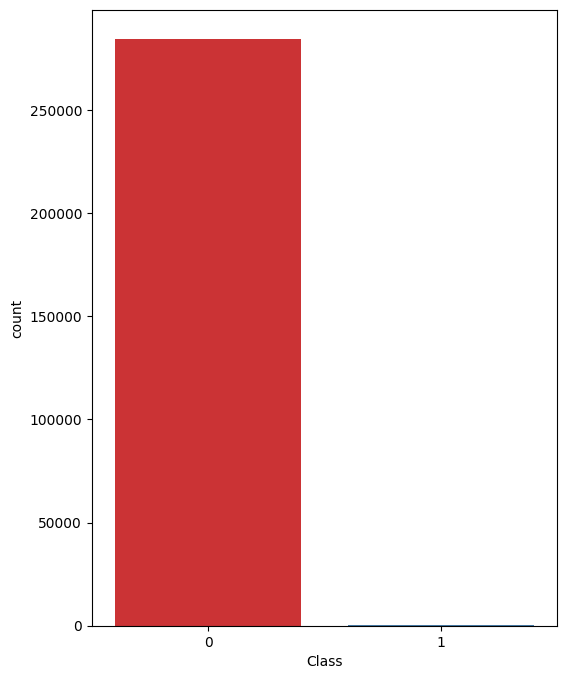

In [ ]:
f,ax=plt.subplots(figsize=(6,8))
ax=sns.countplot(x='Class',data=data,palette='Set1')
plt.show()

In [ ]:
fraud=data[data['Class']==1]
normal=data[data['Class']==0]
print('The shape of the Normal Transactions: {}\n'.format(normal.shape))
print('The shape of the Fraud Transactions : {}\n'.format(fraud.shape))

The shape of the Normal Transactions: (284315, 33)

The shape of the Fraud Transactions : (492, 33)



<ipython-input-64-2986e675139e>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['Time'],bins=100)


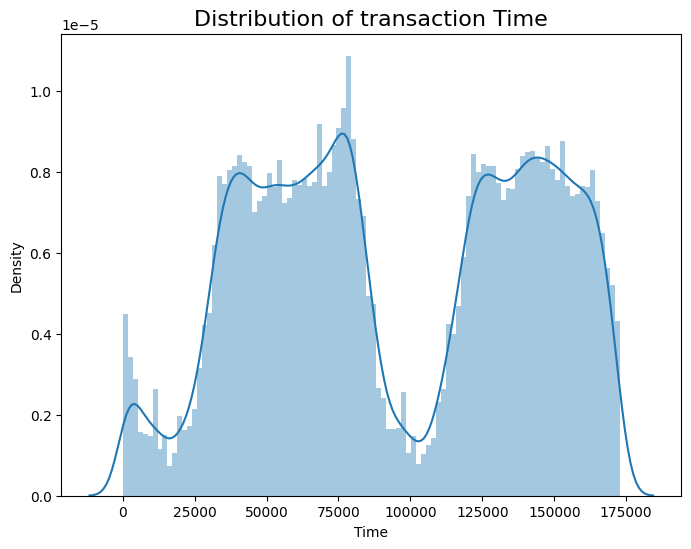

In [ ]:
plt.figure(figsize=(8,6))
sns.distplot(data['Time'],bins=100)
plt.title('Distribution of transaction Time',fontsize=16)
plt.show()

This dataset contains two day trading information , looking at the distribution chart we see two peaks and two troughs. Most likely the two peaks are the transactions dutring daytime because of the high volume of transations, and the two troughs are transactions at night when everyone is asleep.

Text(0.5, 1.0, 'Distribution of Normal Trnasaction')

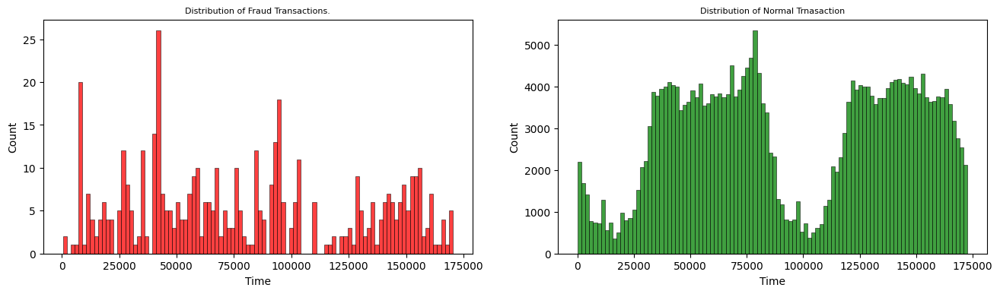

In [ ]:
fig,axs=plt.subplots(ncols=2,figsize=(16,4))

sns.histplot(fraud['Time'],bins=100,color='red',ax=axs[0])
axs[0].set_title("Distribution of Fraud Transactions.",fontsize=8)

sns.histplot(normal['Time'],bins=100,color='green',ax=axs[1])
axs[1].set_title("Distribution of Normal Trnasaction",fontsize=8)

Distribution of Amount

Text(0.5, 1.0, 'distribution of Normal Amount')

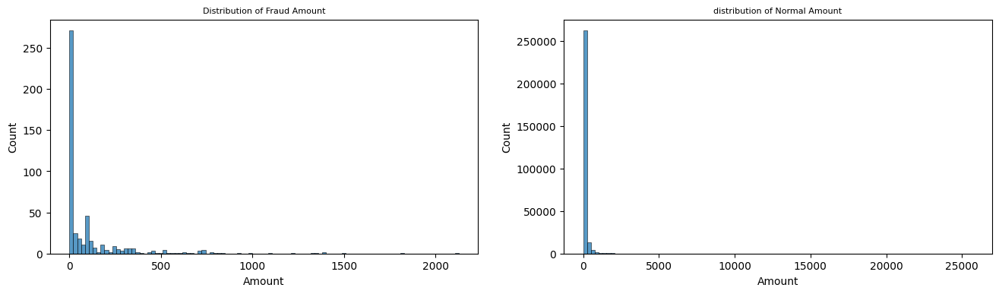

In [ ]:
fig,axs=plt.subplots(ncols=2,figsize=(16,4))

sns.histplot(fraud['Amount'],bins=100,ax=axs[0])
axs[0].set_title("Distribution of Fraud Amount",fontsize=8)

sns.histplot(normal['Amount'],bins=100,ax=axs[1])
axs[1].set_title("distribution of Normal Amount",fontsize=8)

In [ ]:
import numpy as np
#scaling the Amount column by log
data['Amount_log']=np.log(data['Amount']+0.0001)

Log transformations are highly useful for converting the skewed distribution into gaussian normal distribution because they they tend expand values in lower magnitude range and tend to compress /reduce the values in the highermagnitude range.

In [ ]:
fraud=data[data['Class']==1]
normal=data[data['Class']==0]

Text(0.5, 1.0, 'distribution of Normal Amount')

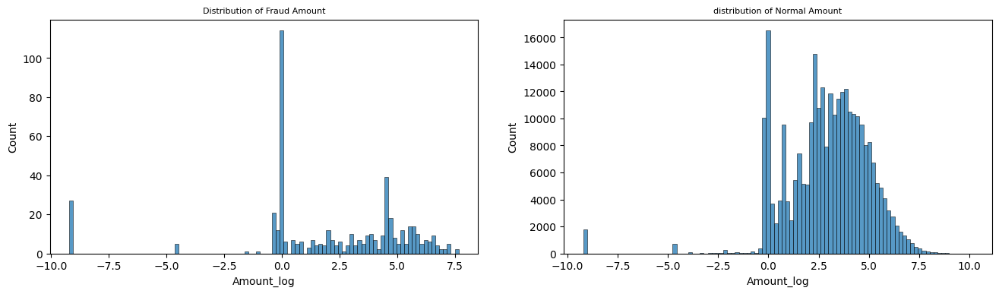

In [ ]:
fig,axs=plt.subplots(ncols=2,figsize=(16,4))

sns.histplot(fraud['Amount_log'],bins=100,ax=axs[0])
axs[0].set_title("Distribution of Fraud Amount",fontsize=8)

sns.histplot(normal['Amount_log'],bins=100,ax=axs[1])
axs[1].set_title("distribution of Normal Amount",fontsize=8)

Relationship of fraud transactions with amount of money

Let us try to determine the nature of transactions which are fraud and obtain a relevant set of the same with respect to their amount.

We hypothesise based on our scatter plot that all fraud transactions occur for an amount less than 2500.

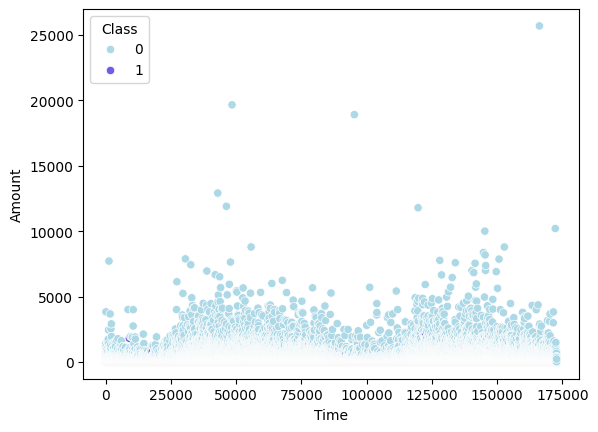

In [ ]:
# Create a scatterplot
sns.scatterplot(x="Time", y="Amount", hue="Class", data=data, palette={0: "#ADD8E6", 1: "#6c5ce7"})
plt.show()

Insights

1)It can be observed that fraud transcations are generally not above an amount of 2500

2)It can also be observed that the fraud transactions are evenly distributed about time.

In [ ]:
data_refine = data[["Time", "Amount", "Class"]]

In [ ]:
amount_more = 0
amount_less = 0
for i in range(data_refine.shape[0]):
    if(data_refine.iloc[i]["Amount"] < 2500):
        amount_less += 1
    else:
        amount_more += 1
print(amount_more)
print(amount_less)

449
284358


In [ ]:
percentage_less = (amount_less/data.shape[0])*100
percentage_less

99.84234938045763

So now out of the total transactions, 449 transactions have amount greater than 2500 while reamnining 284358 transactions have amount less than 2500.

That is 99.84% of the total transactions have amount less than 2500

In [ ]:
fraud =0
legitimate =0
for i in range(data_refine.shape[0]):
    if(data_refine.iloc[i]["Amount"]<2500):
        if(data_refine.iloc[i]["Class"] == 0):
            legitimate += 1
        else:
            fraud+=1
print(fraud)
print(legitimate)

492
283866


In [ ]:
fraudtot=0
for i in range(data_refine.shape[0]):
  if(data_refine.iloc[i]["Class"]==1):
    fraudtot+=1

print(fraudtot)

492


So now we notice that total number of fraud transactions=492

Also the total number of fraud transactions with Amount<2500 =492

Thus we can say that all the fraud transactions have amount <2500.

Plotting a Correlation Matrix

<Axes: >

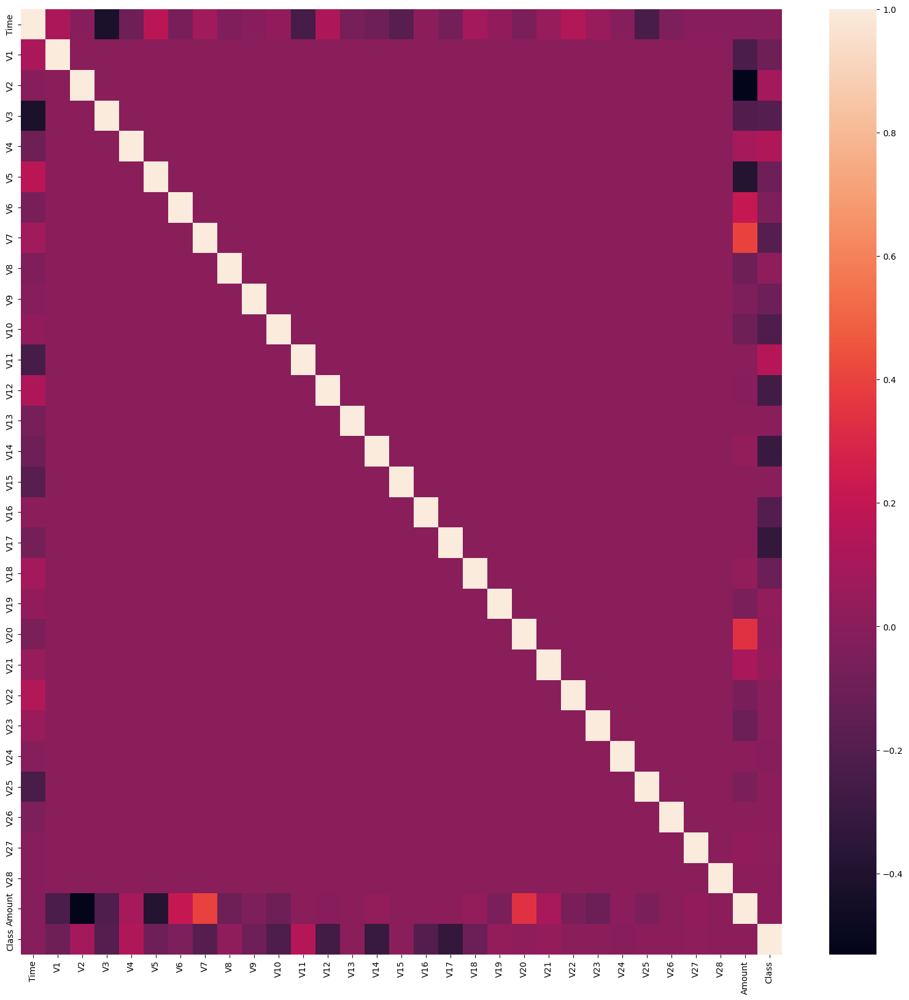

In [ ]:
plt.figure(figsize=(20,20))
data_corr = data.iloc[:,:-3].corr()
sns.heatmap(data_corr)


Plotting the correlation matrix seperately for Fraud and Normal Class

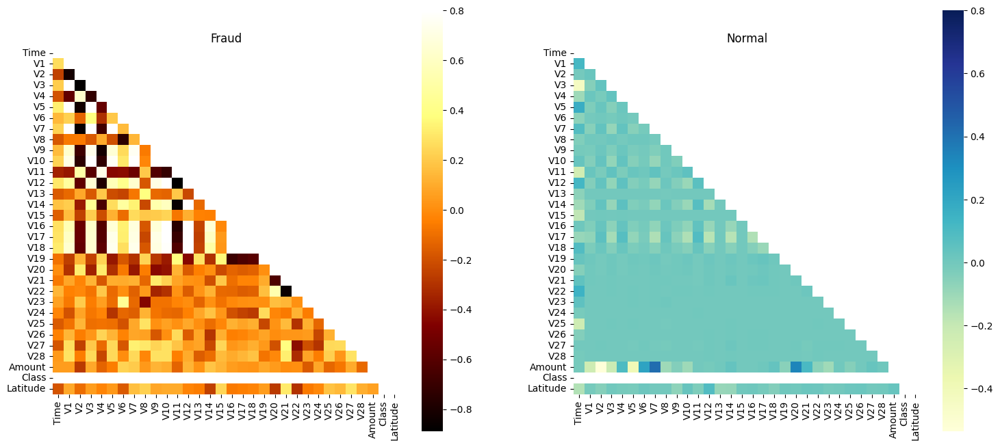

In [ ]:
f, (ax1, ax2) = plt.subplots(1,2,figsize =( 18, 8))
corr = data.iloc[:,:-2].corr()
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap((data.iloc[:,:-2].loc[data['Class'] ==1]).corr(), vmax = .8, square=True, ax = ax1, cmap = 'afmhot', mask=mask,);
ax1.set_title('Fraud')
sns.heatmap((data.iloc[:,:-2].loc[data['Class'] ==0]).corr(), vmax = .8, square=True, ax = ax2, cmap = 'YlGnBu', mask=mask);
ax2.set_title('Normal')
plt.show()

In [ ]:
# Check for missing values
missing_values = data.isnull().sum()

In [ ]:
# Check for invalid latitude and longitude values
invalid_latitudes = data[(data['Latitude'] < -90) | (data['Latitude'] > 90)]
invalid_longitudes = data[(data['Longitude'] < -180) | (data['Longitude'] > 180)]

missing_values, invalid_latitudes.shape, invalid_longitudes.shape

(Time         0
 V1           0
 V2           1
 V3           1
 V4           1
 V5           1
 V6           1
 V7           1
 V8           1
 V9           1
 V10          1
 V11          1
 V12          1
 V13          1
 V14          1
 V15          1
 V16          1
 V17          1
 V18          1
 V19          1
 V20          1
 V21          1
 V22          1
 V23          1
 V24          1
 V25          1
 V26          1
 V27          1
 V28          1
 Amount       1
 Class        1
 Latitude     1
 Longitude    1
 dtype: int64,
 (0, 33),
 (0, 33))

**Geospatial Analysis**

In [ ]:
import folium
from folium.plugins import HeatMap
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Initialize a map centered around the mean latitude and longitude
mean_lat = data['Latitude'].mean()
mean_lon = data['Longitude'].mean()
map_ = folium.Map(location=[mean_lat, mean_lon], zoom_start=2)

In [ ]:
# Filter out rows with missing or invalid latitude/longitude values
data = data.dropna(subset=['Latitude', 'Longitude'])
data = data[(data['Latitude'].between(-90, 90)) & (data['Longitude'].between(-180, 180))]

In [ ]:
# Add transaction locations to the map
heat_data = [[row['Latitude'], row['Longitude']] for index, row in data.iterrows()]
HeatMap(heat_data).add_to(map_)

# Save the map to an HTML file
map_.save('/content/drive/MyDrive/transaction_heatmap.html')
map_

Use clustering techniques like DBSCAN to group transactions

In [ ]:
from sklearn.cluster import DBSCAN
import numpy as np

In [ ]:
coords = data[['Latitude', 'Longitude']].values
db = DBSCAN(eps=0.01, min_samples=5).fit(coords)
labels = db.labels_

data['Cluster'] = labels

Identify outliers which may indicate fraud.

In [ ]:
outliers = data[data['Cluster'] == -1]
print(outliers)

            Time        V1        V2        V3        V4        V5        V6  \
4            2.0 -1.158233  0.877737  1.548718  0.403034 -0.407193  0.095921   
11          10.0  0.384978  0.616109 -0.874300 -0.094019  2.924584  3.317027   
12          10.0  1.249999 -1.221637  0.383930 -1.234899 -1.485419 -0.753230   
13          11.0  1.069374  0.287722  0.828613  2.712520 -0.178398  0.337544   
14          12.0 -2.791855 -0.327771  1.641750  1.767473 -0.136588  0.807596   
...          ...       ...       ...       ...       ...       ...       ...   
195668  131170.0 -0.636349  1.593617 -0.392769  1.002223  0.576685 -0.821565   
195669  131170.0  1.680949 -0.601803 -2.311865  0.016391  0.463702 -0.980449   
195670  131170.0  2.006525 -0.435488 -0.521961  0.348701 -0.430132 -0.028130   
195671  131170.0 -0.236816  0.943198 -0.968759 -0.565803  0.518020 -0.684578   
195672  131171.0  1.147549 -1.592788 -1.123557  0.541849  0.072173  1.560285   

              V7        V8        V9  .

Use machine learning algorithms to detect anomalies.

In [ ]:
from sklearn.ensemble import IsolationForest

features = data[['Latitude', 'Longitude', 'Amount']]
model = IsolationForest(contamination=0.01)
data['Anomaly'] = model.fit_predict(features)

anomalies = data[data['Anomaly'] == -1]
print(anomalies)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


            Time        V1         V2        V3        V4        V5        V6  \
51          36.0 -1.004929  -0.985978 -0.038039  3.710061 -6.631951  5.122103   
89          59.0 -0.773293  -4.146007 -0.932038  0.027094 -1.698307  0.460188   
164        103.0 -6.093248 -12.114213 -5.694973  3.294389 -1.413792  4.776000   
865        656.0 -1.789835  -5.835768 -1.472791 -0.851160 -2.433875  0.401415   
1027       775.0 -3.900810  -3.098370 -0.213428 -2.678434 -2.927576  0.735688   
...          ...       ...        ...       ...       ...       ...       ...   
195475  131077.0 -0.497686  -4.552162 -3.158123  1.019695 -1.063958  0.058374   
195492  131084.0 -1.713524  -1.454474 -2.085923  1.176238 -1.008929  0.349107   
195516  131091.0 -0.896778  -5.973239 -5.709827 -0.642012  1.032972  3.170720   
195600  131141.0 -0.378498  -4.328499 -2.264641  0.831995 -0.600228  2.217072   
195644  131156.0  0.352027  -3.716735 -3.649624 -0.238555 -0.673267 -0.906379   

              V7        V8 

Validate the model's performance using metrics like precision, recall, and F1-score

In [ ]:
from sklearn.metrics import classification_report

y_true = data['Class']
y_pred = data['Anomaly'].apply(lambda x: 1 if x == -1 else 0)
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

         0.0       1.00      0.99      0.99    195291
         1.0       0.00      0.02      0.01       382

    accuracy                           0.99    195673
   macro avg       0.50      0.50      0.50    195673
weighted avg       1.00      0.99      0.99    195673



Predict the legitimacy of new transactions:

In [ ]:
import numpy as np

def check_transaction_legitimacy(lat, lon, amount, dbscan_model, data):
    new_transaction = np.array([[lat, lon, amount]])
    cluster_label = dbscan_model.fit_predict(np.vstack([data[features].values, new_transaction]))[-1]
    return "Legitimate" if cluster_label != -1 else "Fraudulent"

# Example transaction
lat, lon, amount = 42.483333, 1.466667, 150.00
legitimacy = check_transaction_legitimacy(lat, lon, amount, db, data)
print(f"The transaction is: {legitimacy}")

ValueError: Boolean array expected for the condition, not float64